In [87]:
from mpl_toolkits.basemap import Basemap
import pandas as pd
import requests
from bs4 import BeautifulSoup as BS
from IPython.core.display import HTML
from io import StringIO
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import string
import ipywidgets as widgets
import matplotlib.animation as animation
import csv
import geopandas as gpd
from shapely.geometry import Point## in order to create a geometry column with the Point 
#these imports are for choropleth map
import plotly.express as px
import plotly.graph_objects as go
import json
from ipywidgets import interact##for the interactive map
import matplotlib.ticker as ticker##used for the race bar
import matplotlib.animation as animation##used for hte race bar
%matplotlib inline

# https://en.wikipedia.org/wiki/List_of_deadly_earthquakes_since_1900

In [59]:
#request the website to use that data
response = requests.get('https://en.wikipedia.org/wiki/List_of_deadly_earthquakes_since_1900')
#this cleans up the raw file and makes it a littlel easier to read
soup = BS(response.text, 'html.parser')
#this is a way to print the table as it is on the website just to see that you selected the correct one
table_html = str(soup.find('table', attrs={'class' : 'sortable wikitable'}))
#this gives us the table as list. now we have something to work with 
####ALSO all the missing values from the original table have been automatically replaced with NaN values 
tables = pd.read_html(table_html)
#this turns the list into a dataframe. might need help understanding how this works!
earth_table = tables[0]

### Clean the Country column

In [60]:
#add an underscore to the empty spaces
earth_table.columns=earth_table.columns.str.replace(' ','_')
#rename the country column
earth_table=earth_table.rename(columns={'Present-day_country_and_link_to_Wikipedia_article':'country'})
#create a function that removed the links at the end of the country name. split on ('space(')
def country(r):
    remove_link=str(r).split(' (')
    
    if len(remove_link)==1:
        just_name=r
    else:
        just_name=remove_link[0]
        
    return just_name

#use the function to remove the links from country name
earth_table.country=earth_table.country.apply(country)

#im removing this column because its not a coutry 
earth_table[earth_table['Origin_(UTC)']=='1997-07-09 19:24']

#there is a column with the country 'see' which is not a coutry. remove that row.
#delet the row using the index id of the row you want deleted.
earth_table.drop(earth_table[earth_table['Origin_(UTC)']=='1997-07-09 19:24'].index,inplace=True)

#replace country names of United States Minor Outlying Islands and US Territory of Alaska to United States
#by using .replace
earth_table['country']=earth_table['country'].replace({'United States Minor Outlying Islands':'United States',
                                                      'US Territory of Alaska':'United States'})

### Clean the Magnitude column

In [61]:
#create a funcition.use the function to only get the digit in magnitude
def only_one(x):
    #need to put the str()otherwise the fuction will not work in the magnitute column
    #because the magnitude column has a NaN value.
    split=str(x).split(' ')
    
    if len(split)==1:
        single=x
    else:
        single=split[0]
        
    return single

#now apply the function to Magnitude to get only the digit value 
earth_table.Magnitude=earth_table['Magnitude'].apply(only_one)

### Clean the Other_Source_Deaths  and EM-DAT_Total_Deaths columns

In [62]:
#for one in other source deaths. give me the highest of the values if there are more than one per cell:
def one_number(y):
    split=str(y).split('_')
    if len(split)==1:
        num=y
        #print(num)
    elif len(split)<=3:
        numm=y.replace(r'*',r'')
        splitt=str(numm).split('_')
        #usedmem=initial_data['USEDMEM'].str.replace(r'(M)',r' \1')
        #s = list(one.split('_'))
        #print(s)
        num=max(splitt)
    else:
        num=y[0:3]
        
    return num

#replace spaced with underscores. for the Other Source Deaths column
earth_table.Other_Source_Deaths=earth_table.Other_Source_Deaths.str.replace(' ','_')

#get only the highest value if there are multipe number and remove words
earth_table.Other_Source_Deaths=earth_table.Other_Source_Deaths.apply(one_number)

#for a in column 
def remove_all(a):
    take_plus=str(a).replace('+','')
    add_sub=take_plus.replace('[','_')
    sub_split=str(add_sub).split('_')
    if len(sub_split)==1:
        single=a
    else:
        remove=str(a).split('_')
        #print(remove[0])
        single=remove[0]
    
    return single
 
#remove and replace varous things to clean up the last 2 columns
earth_table.Other_Source_Deaths=earth_table.Other_Source_Deaths.str.replace('+','')
earth_table.Other_Source_Deaths=earth_table.Other_Source_Deaths.str.replace('[','_')
#remove the comma from the value 222,517 and add a undescore inthe EM dat total deths column
earth_table.Other_Source_Deaths=earth_table.Other_Source_Deaths.str.replace(',','')
earth_table['EM-DAT_Total_Deaths']=earth_table['EM-DAT_Total_Deaths'].str.replace('[','_')


#this removes all the footnotes and other stuff from the last 2 columns. now apply the function to the two columns
earth_table.Other_Source_Deaths=earth_table.Other_Source_Deaths.apply(remove_all)
earth_table['EM-DAT_Total_Deaths']=earth_table['EM-DAT_Total_Deaths'].apply(remove_all)

### Creating a new column Highest_Death and a column with just the year

In [63]:
#change the type to floats for these columns or the highest death column will not 
#be calculated properly 
earth_table.Other_Source_Deaths=earth_table.Other_Source_Deaths.astype('float')
earth_table['EM-DAT_Total_Deaths']=earth_table['EM-DAT_Total_Deaths'].astype('float')

#create a new column that evaluates the 4 total death columns and add the 
#highest value out of the 4 to the new column. call this 'deatht'
#frame['HighScore'] = frame[['test1','test2','test3']].max(axis=1)
earth_table['highest_death']=earth_table[['PDE_Total_Deaths','Utsu_Total_Deaths',
                                          'EM-DAT_Total_Deaths','Other_Source_Deaths']].max(axis=1)

#converted the origin_(UTC) section to datetime type
earth_table['Origin_(UTC)']=pd.to_datetime(earth_table['Origin_(UTC)'])

#add a column with just year
earth_table['year']=earth_table['Origin_(UTC)'].dt.year

#i will also be removing this row because there is no lat or long values
earth_table[earth_table.Lat=='?']
#delet the row using the index id of the row you want deleted.
earth_table.drop(earth_table[earth_table['Lat']=='?'].index,inplace=True)

#i am going to replace the NaN values in the Secondary_Effects column only.I will change NaN to 'no report'
#df[1].fillna(0, inplace=True)
earth_table['Secondary_Effects']=earth_table['Secondary_Effects'].fillna('no report')

### export the clean DATA###

In [64]:
#exported my earth table dataframe to use for other steps
earth_table_df=earth_table.to_csv('data/earth_table.csv',index=None)

### export the clean DATA^^^###

### World Data Exploration 

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:54: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.



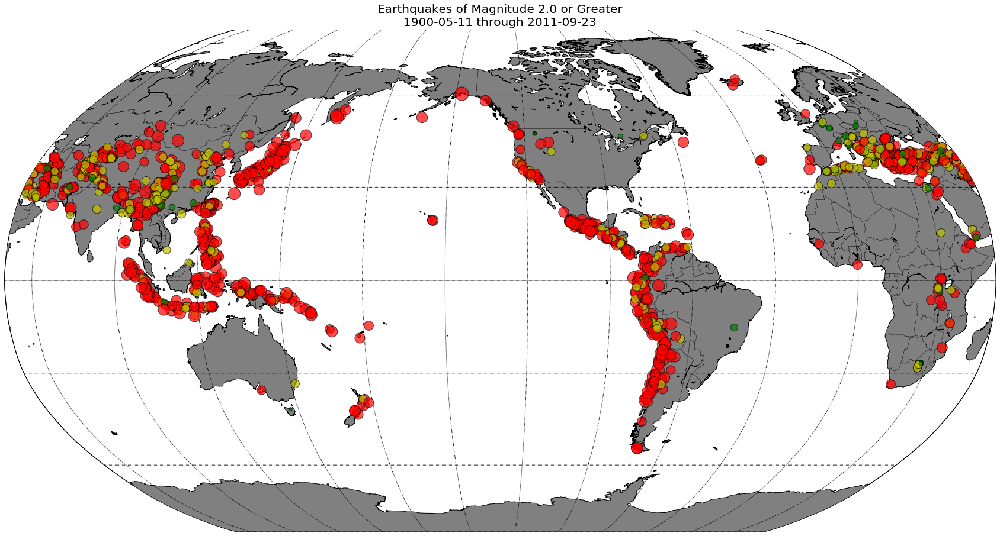

In [65]:
###BASEMAP EXPLORATION###
#exprot a file that will work for the basemap format. remove all the NaN values and a few columns
#read in the file 
quake_data=pd.read_csv('data/earth_table.csv')
#rename column
quake_data=quake_data.rename(columns={'Origin_(UTC)':'Origin'})
#drop lots of columns
quake_data= quake_data.drop(columns= ['Depth_(km)','year','highest_death','Other_Source_Deaths','EM-DAT_Total_Deaths','Utsu_Total_Deaths','PDE_Total_Deaths','PDE_Shaking_Deaths','Secondary_Effects'])
#drop NaN values 
#df.dropna()
quake_data=quake_data.dropna()
#export the file that had only the 4 columns and all the NaN values removed 
no_nan=quake_data.to_csv('data/no_nan.csv',index=None)

#import csv##NEED TO import csv for this 
maps = 'data/no_nan.csv'
# Create empty lists for the latitudes,longitudes,magnitudes and timestrings.
lats, lons = [], []
magnitudes = []
timestrings = []
# Read through the entire file, skip the first line,
#  and pull out just the lats,longs, mag, and timestrings.
with open(maps) as f:
    # Create a csv reader object.
    reader = csv.reader(f)
    # Ignore the header row.
    next(reader)
    # Store the latitudes and longitudes in the appropriate lists.
    for row in reader:
        lats.append(float(row[2]))
        lons.append(float(row[3]))
        magnitudes.append(float(row[4]))
        timestrings.append(row[0])
        

#NOW BUILD THE ACUTAL MAP
#lets add color to the dots. green will mean less that 5 magnituede, yellow if its less that 6. and red for rest
def get_color(magnitudes):
    # Returns green for small earthquakes, yellow for moderate
    #  earthquakes, and red for significant earthquakes.
    if magnitudes < 5.0:
        return ('go')
    elif magnitudes < 6.0:
        return ('yo')
    else:
        return ('ro')
    
    
# Make this plot larger.
plt.figure(figsize=(30,30))

##THE MAP##
eq_map = Basemap(projection='robin', resolution = 'l', area_thresh = 1000.0,
              lat_0=0, lon_0=-130)
eq_map.drawcoastlines()
#Let’s add country border
eq_map.drawcountries()
eq_map.fillcontinents(color = 'grey')

#Now let’s clean up the edge of the globe
eq_map.drawmapboundary()#(fill_color='aqua')
#Now let’s draw latitude and longitude lines
eq_map.drawmeridians(np.arange(0, 360, 30))
eq_map.drawparallels(np.arange(-90, 90, 30))

#set it to where the dot size is adjusted to magnitude 
min_marker_size = 2.5
for lon, lat, mag in zip(lons, lats, magnitudes):
    x,y = eq_map(lon, lat)
    msize = mag * min_marker_size
    marker_string = get_color(mag)
    eq_map.plot(x, y, marker_string, markersize=msize,markeredgecolor='k',alpha=0.7)#the maerkeredgecolor gives the dots black lines
#Our title needs to include the date range for these earthquakes, which requires us to pull in a little more
#data when we parse the raw text. To make the title, we'll use the dates of the first and last earthquakes.
#Since the file includes the most recent earthquakes first, we need to use the last items as the starting date:    
title_string = "Earthquakes of Magnitude 2.0 or Greater\n"
title_string += "%s through %s" % (timestrings[0][:10], timestrings[-1][:10])
plt.title(title_string,fontsize=20);

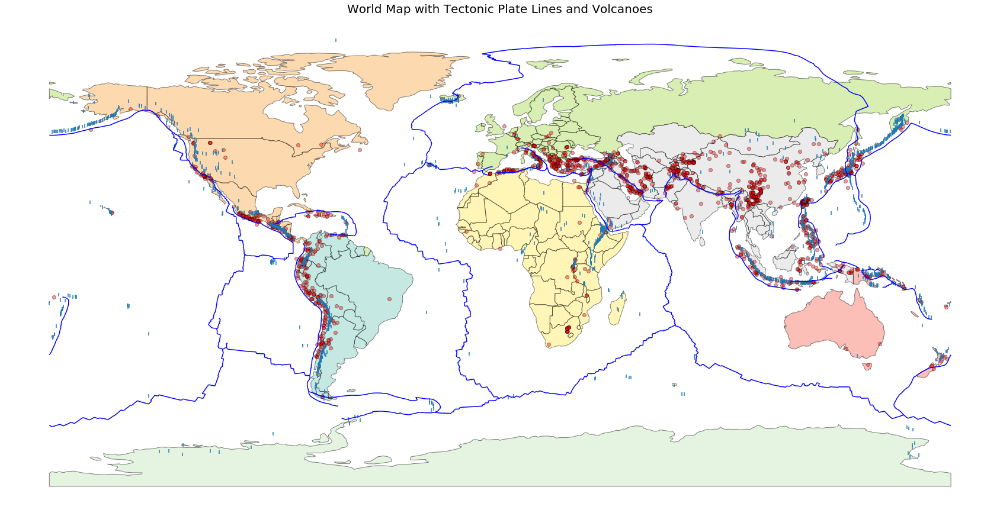

In [75]:
###make a map using geopandas that has points of earthquakes, tectonic plates, and volcanoes

##bring is no nan value data for geopandas map
geo_practice=pd.read_csv('data/no_nan.csv')

##you can do it this way,where x and y are sperated. or make a geometry column as a geopandas dataframe and plot that
#Plot the locations of all earthquakes
#plt.scatter(x = chickens.lat, y = chickens.lng)
####plt.scatter(x=geo_practice.Long,y=geo_practice.Lat);###

##create a new column called geometry..Point comes for the point package
geo_practice['geometry'] = geo_practice.apply(lambda row: Point(row['Long'], row['Lat']), axis = 1)
#we want a geoDataFrame
geo_practice = gpd.GeoDataFrame(geo_practice, geometry = 'geometry')

#bring the world Data
#geopandas has a world map within the package.
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

#bring in the tectonic plates from around the world. 
tectonic_lines=gpd.read_file('data/Plate_Boundaries/Plate_Boundaries.shp')

#also bring in the volcano data 
volcano=gpd.read_file('data/Volcano_Locations_%5Bfrom_Smithsonian%5D/Volcano_Locations_[from_Smithsonian].shp')

##now attempt to combin the scatter plots,the map,the tectonic lines ,and the volcanoes
fig, ax = plt.subplots(figsize = (30,30))
world.plot(ax=ax,column='continent',legend=False,edgecolor='black',cmap='Set3_r',alpha=0.5)#this alpha it connected to continent
#you can also plot just the column you want. i.e. magnitude for example 
geo_practice[(geo_practice['Magnitude']>=1)].plot(ax=ax,c='r',alpha=0.4,edgecolor='black')
volcano.plot(marker='|',ax=ax,alpha=1)
plt.axis('off')
plt.title('World Map with Tectonic Plate Lines and Volcanoes',fontsize=20)
tectonic_lines.plot(edgecolor='blue',ax=ax);

In [68]:
#use gapmider dataframe
gapminder=px.data.gapminder()
#remove all the columns except for country and iso_alpha
gapminder=gapminder.drop(columns=['year','lifeExp','pop','gdpPercap','iso_num','continent'])

In [77]:
#make a CHOROPLETH MAP
#bring is no nan value data for choropleth
choro_practice=pd.read_csv('data/no_nan.csv')

##merge the gapmider with my choro_practice on country to get the iso_alpha which is required to make the map 
#cumsum_df_continent=pd.merge(cumsum_df,continent_colum)
choro_merger=pd.merge(choro_practice,gapminder)

#the MAP
fig = px.scatter_mapbox(choro_merger, lat="Lat", lon="Long", hover_name="country", hover_data=["Magnitude", "iso_alpha"],
                         color_discrete_sequence=["darkred"],zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [70]:
##one last world map showing the highest earthquake per country 
choro_merger=choro_merger.groupby(['country','iso_alpha'],as_index=None)[['Magnitude']].max()

#the MAP
fig = go.Figure(data=go.Choropleth(
    locations = choro_merger['iso_alpha'],
    z = choro_merger['Magnitude'],
    text = choro_merger['country'],
    colorscale ='reds',
    autocolorscale=False,
    reversescale=False,
    marker_line_color='blue',
    marker_line_width=0.5,
   # colorbar_tickprefix = '$',
    colorbar_title = 'Magnitude',
))

fig.update_layout(
    title_text='Highest Recorded Earthquake',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ),
    
    )


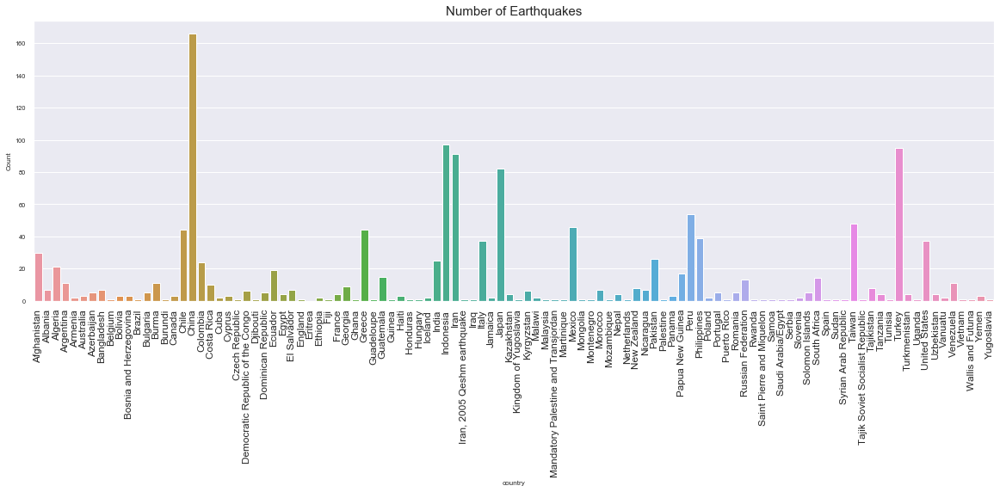

In [79]:
#read in the clean data file 
occurence=pd.read_csv('data/earth_table.csv')

#all the countires and their earthquake count
country=occurence.groupby('country',as_index=None)[['Magnitude']].count()
country=country.rename(columns={'Magnitude':'Count'})
#this makes the figure bigger 
plt.figure(figsize=(20, 6))
sns.set(font_scale=.68)

sns.barplot(x="country", y="Count", data=country).set_title('Number of Earthquakes',fontsize=15)
plt.xticks(
    rotation=90, 
    horizontalalignment='center',
    fontweight='light',
    fontsize='x-large'  
);

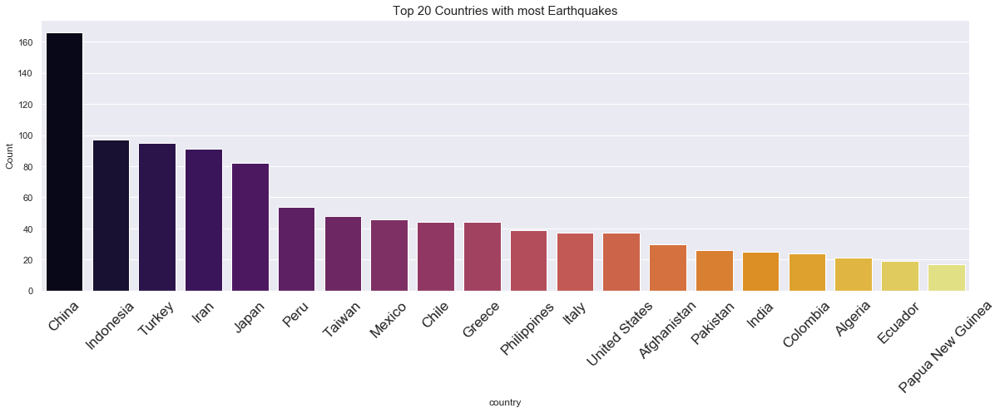

In [80]:
#zooom in to the top 20 coutires with the most earthquakes in the century.
the_20=country.nlargest(n=20,columns='Count')

#plot the top 20
plt.figure(figsize=(20, 6))
sns.set(font_scale=1)

sns.barplot(x="country", y="Count", data=the_20,palette='inferno').set_title('Top 20 Countries with most Earthquakes',fontsize=15)
plt.xticks(
    rotation=45, 
    horizontalalignment='center',
    fontweight='light',
    fontsize='x-large'  
);

In [82]:
#create an interact that lets you select the year and the coutries for that year show and their deaths
@interact(Year = occurence.year.dropna().unique())
def show(Year):
   
    data=occurence.loc[occurence.year==Year][['country','highest_death']]
    data.plot.bar(x='country',y='highest_death',facecolor='r',edgecolor='b',figsize=[16,7]).get_legend().remove()
    #plt.figure(figsize=(6,3))
    plt.ylabel('Deaths')
    plt.xlabel('')
    plt.title('Deaths per Year')
    

interactive(children=(Dropdown(description='Year', options=(1900, 1901, 1902, 1903, 1904, 1905, 1906, 1907, 19…

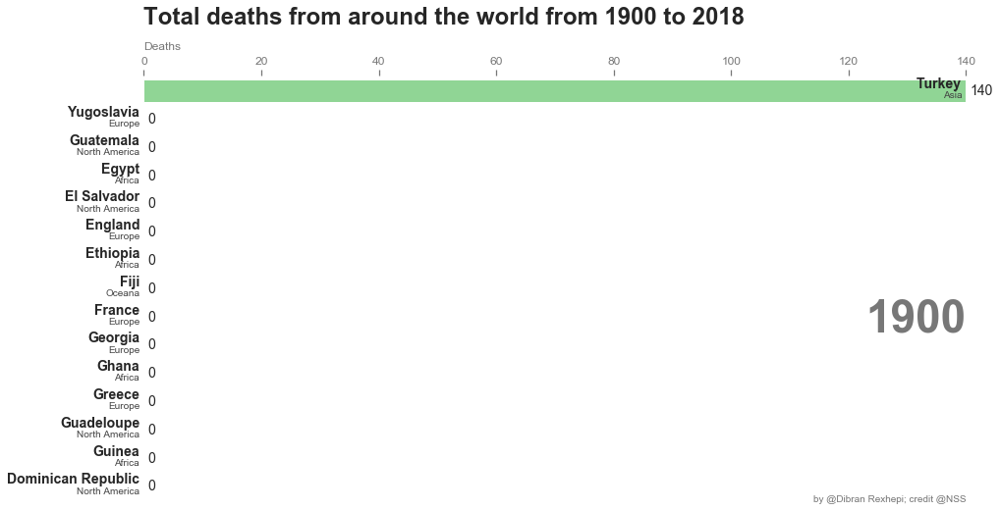

In [91]:
###THE RACE BAR GRAPH###
#import matplotlib.ticker as ticker##used for the race bar
#import matplotlib.animation as animation##used for the race bar
#bring in the data
the_world=pd.read_csv('data/earth_table.csv')
#remove rows who highest_death has NaN values
#df = df[np.isfinite(df['EPS'])]
the_world=the_world[np.isfinite(the_world['highest_death'])]

#groupby year and country and get the sum of highest death. save it as grp_yr_country
grp_yr_country=the_world.groupby(['year','country'],as_index=None)[['highest_death']].sum()

##create a dataframe and column with years only
year=pd.DataFrame({'year':range(1900,2019)})
#create a column key with the value of zero.
year['key']=0

#get all the unique countries
Uniq=the_world.country.unique()
#create a DataFrame of Uniq
only_countries=pd.DataFrame({'country':Uniq})
#create a dummy column so that you can merge the year and uniq together on hte key column
only_countries['key']=0

#now merge the year and only_countires  together
column=pd.merge(year,only_countries)

#now merge the grp_yr_country and column.how=left mean keep every row in the left DataFrame
#Where there are missing values in the right dataframe, it adds empty / NaN values in the result.
my_year_data=pd.merge(column,grp_yr_country,how='left')
#df[1].fillna(0, inplace=True)
#change all highest_death NaN values to zero
my_year_data['highest_death'].fillna(0,inplace=True)
#drop the key column
my_year_data=my_year_data.drop(['key'],axis=1)
#my_year_data=my_year_data.drop(['Secondary_Effects'],axis=1)

#do a double groupby and a cumsum() for each specific year and specific country
#df.groupby(by=['name','day']).sum().groupby(level=[0]).cumsum()
#The index number has to go, as the cumsums are from multiple rows,
#like the 2nd number, 40, is 10+20+10, which index value should it get? 1, 2 or 3? 
#So, let's keep using name and day as multiIndex, which make better sense (reset_index() to get int index, 
#if desired). 2), the level=[1] means groupby is to operate by the 1st level of MultiIndex, namely column name. –
cumsum_df=my_year_data.groupby(['year','country']).sum().groupby(level=[1]).cumsum().reset_index()


#create a continent dataframe. manually put NaN values if columns are not same lenght
continents=pd.DataFrame({'Europe':['Spain','Slovenia','Serbia','Netherlands','Bolivia','Poland','Czech Republic','Belgium','Yugoslavia','Montenegro','Bosnia and Herzegovina','Hungary','Cyprus','Romania','Armenia','England','Kingdom of Yugoslavia','Georgia','Iceland','Portugal','France','Bulgaria','Greece','Albania','Italy',np.nan,np.nan,np.nan,np.nan,np.nan],
                         'Asia':['Iran, 2005 Qeshm earthquake','Vietnam','Saudi Arabia/Egypt','Malaysia','Iraq','Afghanistan','Syrian Arab Republic','Tajik Soviet Socialist Republic','Yemen','Nepal','Burma','Turkmenistan','Mandatory Palestine and Transjordan','Bangladesh','Russian Federation','Kazakhstan','Kyrgyzstan','Pakistan','Tajikistan','Turkey','Japan','Azerbaijan','China','Uzbekistan','Palestine','Iran','Taiwan','India','Indonesia','Philippines'],
                         'Oceana':[np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,'Samoa','Wallis and Futuna','Vanuatu','Papua New Guinea','Fiji','Solomon Islands','New Zealand','Australia'],
                        'North America':[np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,'Martinique','Guadeloupe','Honduras','Panama','Costa Rica','Haiti','Dominican Republic','Canada','Cuba','Nicaragua','Saint Pierre and Miquelon','Puerto Rico','El Salvador','Guatemala','United States','Jamaica','Mexico'],
                        'South America':['Ecuador',np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,'Brazil','Venezuela','Colombia','Argentina','Peru','Chile'],
                        'Africa':[np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,'Rwanda','Mozambique','Burundi','Uganda','Sudan','Malawi', 'Djibouti','Guinea','South Africa','Tanzania','Democratic Republic of the Congo','Tunisia', 'Morocco','Egypt','Ethiopia','Ghana','Algeria']},
                       columns=['Asia','Europe','Oceana','North America','South America','Africa'])

#this code breaks it down to where continet and contry are separete columns so it looks better. i.e. US- north america,brazil-south america ect.
continent_colum=continents.stack().reset_index().set_index(0)['level_1']
#s = df.stack().reset_index().set_index(0)['level_1']

#reset index
continent_colum=continent_colum.to_frame().reset_index()
#rename columns
continent_colum=continent_colum.rename(columns={0:'country','level_1':'continent'})
#now merge the cumsum_df with continent_colum on coutry to get the continent representation 
cumsum_df_continent=pd.merge(cumsum_df,continent_colum)

###exported my continents to see how they look
cumsum_df_continent_export=cumsum_df_continent.to_csv('data/continents_added.csv',index=None)

##NOW BEGIN THE RACE GRAPH 
current_year=2018
#highest_total_death=cumsum_df_continent[cumsum_df_continent['year'].eq(current_year)].sort_values(by='highest_death',ascending=False).head(15)

#We’ll user colors and color_by_continent to add color to the bars.
colors = dict(zip(
    ['Oceana','Europe','Asia','South America','North America','Africa'],
    ['#adb0ff', '#ffb3ff', '#90d595', '#aafbff', '#f7bb5f', '#eafb50']
))
color_by_continent = cumsum_df_continent.set_index('country')['continent'].to_dict()

#the figure 
#fig, ax = plt.subplots(figsize=(15, 8))

def draw_barchart(year):
    highest_total_death = cumsum_df_continent[cumsum_df_continent['year'].eq(year)].sort_values(by='highest_death', ascending=True).tail(15)
    ax.clear()
    ax.barh(highest_total_death['country'], highest_total_death['highest_death'], color=[colors[color_by_continent[x]] for x in highest_total_death['country']])
    dx = highest_total_death['highest_death'].max() / 200
    for i, (highest_death, country) in enumerate(zip(highest_total_death['highest_death'], highest_total_death['country'])):
        ax.text(highest_death-dx, i,     country,           size=14, weight=600, ha='right', va='bottom')
        ax.text(highest_death-dx, i-.25, color_by_continent[country], size=10, color='#444444', ha='right', va='baseline')
        ax.text(highest_death+dx, i,     f'{highest_death:,.0f}',  size=14, ha='left',  va='center')
    # ... polished styles
    ax.text(1, 0.4, year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Deaths', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, 'Total deaths from around the world from 1900 to 2018',
            transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'by @Dibran Rexhepi; credit @NSS', transform=ax.transAxes, ha='right',
            color='#777777', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
#draw_barchart(2018)

#now run THE animaiton 
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range(1900, 2019))
HTML(animator.to_jshtml())

### search how Secondary Effects play a role on increase deaths

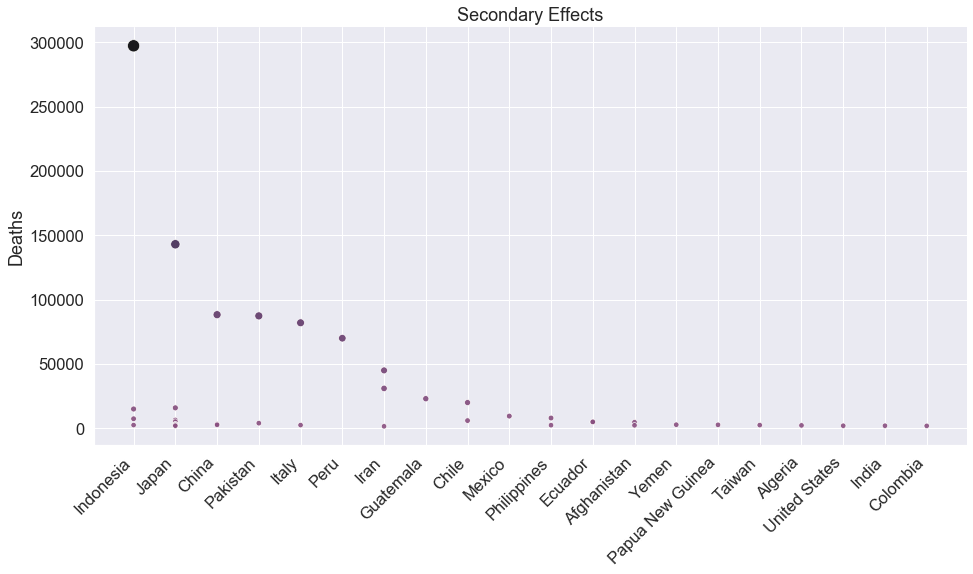

In [94]:
#bring the clean data
secondary_effect=pd.read_csv('data/earth_table.csv')
#give me only rows that have reported secondary effects
secondary_effect=secondary_effect[secondary_effect['Secondary_Effects']!='no report']
#remove rows that have NaN for highest_death column
#df.dropna(subset=[1])
secondary_effect=secondary_effect.dropna(subset=['highest_death'])
#sort my highest death and give me the top 40
secondary_effect=secondary_effect.sort_values(by='highest_death',ascending=False)[:40]

##now graph the data of the top 40 highest deaths.
sns.set(font_scale=1.5,style='darkgrid',palette='deep',context='notebook')
cmap = sns.cubehelix_palette(dark=.01, light=.4, as_cmap=True)
sns.relplot(x='country',y='highest_death',size='highest_death',
                hue='highest_death',height=7,alpha=.9,aspect=2,
                sizes=(30, 150),palette=cmap,data=secondary_effect)._legend.remove()
#add a title
plt.title('Secondary Effects')
plt.xlabel('')#no need for lable in x. it speaks for itself
plt.ylabel('Deaths')
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
      
);

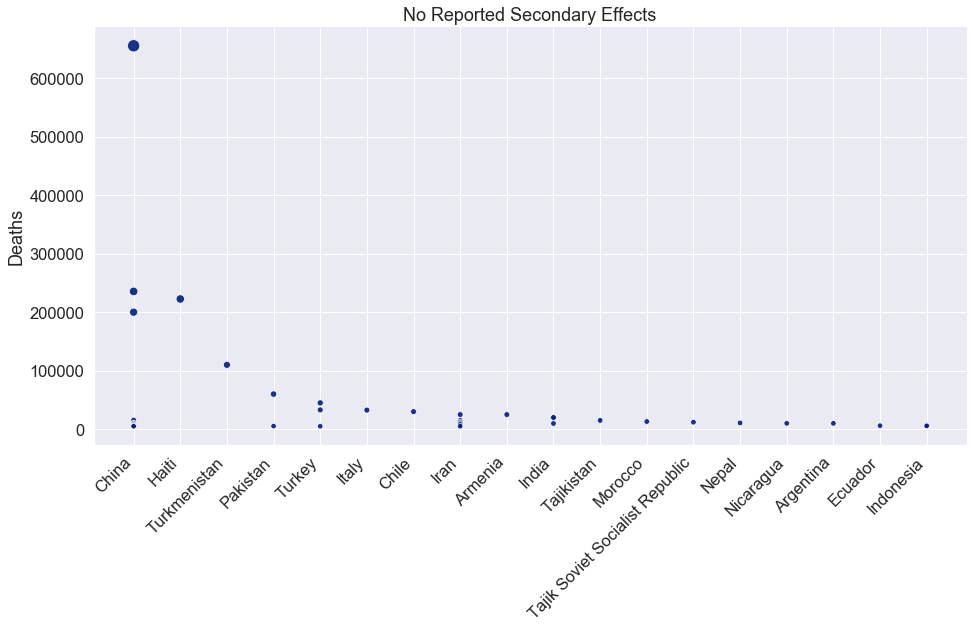

In [95]:
no_report=pd.read_csv('data/earth_table.csv')
#give me only rows that have NO REPORTED secondary effects
no_report=no_report[no_report['Secondary_Effects']=='no report']
#remove rows that have NaN for highest_death column
#df.dropna(subset=[1])
no_report=no_report.dropna(subset=['highest_death'])
#sort my highest death and give me the top 40
no_report=no_report.sort_values(by='highest_death',ascending=False)[:40]

#now the graph
sns.set(font_scale=1.5,style='darkgrid',palette='dark',context='notebook')
cmap = sns.cubehelix_palette(dark=.01, light=.8, as_cmap=True)
sns.relplot(x='country',y='highest_death',size='highest_death',
                height=7,alpha=.9,aspect=2,
                sizes=(30, 150),palette=cmap,data=no_report)._legend.remove()
#add a title
plt.title('No Reported Secondary Effects')
plt.xlabel('')#no need for lable in x. it speaks for itself
plt.ylabel('Deaths')
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
      
);

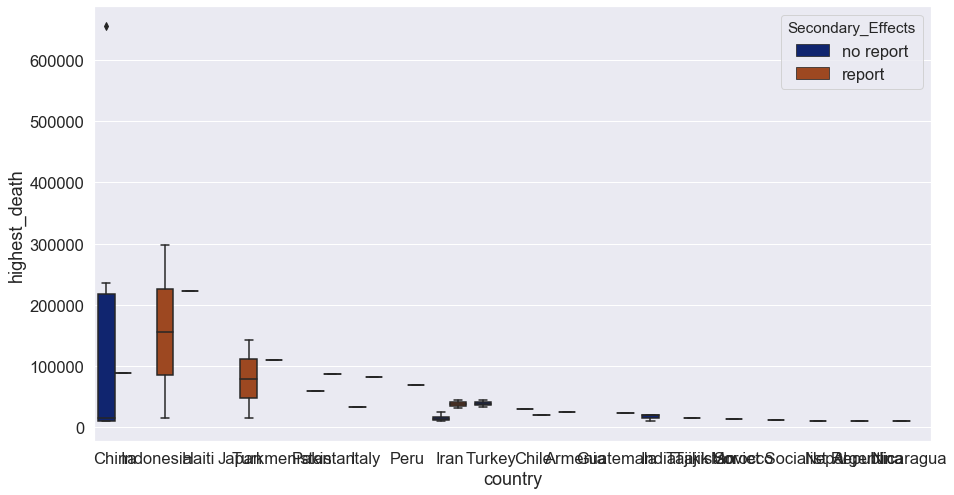

In [121]:
##now make a boxplot of secondary effect vs no secondary effects 
no_v_yes=pd.read_csv('data/earth_table.csv')
#replace the occured secondary effects to just reported
no_v_yes['Secondary_Effects']=no_v_yes['Secondary_Effects'].replace(['L','T','T,L','L,Lq','F','T,F',
                                                               'Lq','T,L,Lq','T,LF','T,Lq','L,F',
                                                               'L,F,Lq'],'report')


#remove rows that have NaN for highest_death column
#df.dropna(subset=[1])
no_v_yes=no_v_yes.dropna(subset=['highest_death'])


###no_v_yes=no_v_yes.groupby(['Secondary_Effects','country'],as_index=None)['highest_death'].sum()

no_v_yes=no_v_yes.sort_values(by='highest_death',ascending=False)[:40]

#create a box plot
fig,ax=plt.subplots(figsize=(15,8))
sns.boxplot(x='country',y='highest_death',hue='Secondary_Effects',data=no_v_yes,ax=ax);


In [120]:
no_v_yes.Secondary_Effects.value_counts()

no report    913
report       358
Name: Secondary_Effects, dtype: int64

### It does not look like there is much difference whether there is Secondary Effects or not^^^^

### see if there is a correlation between Magnitude and Deaths

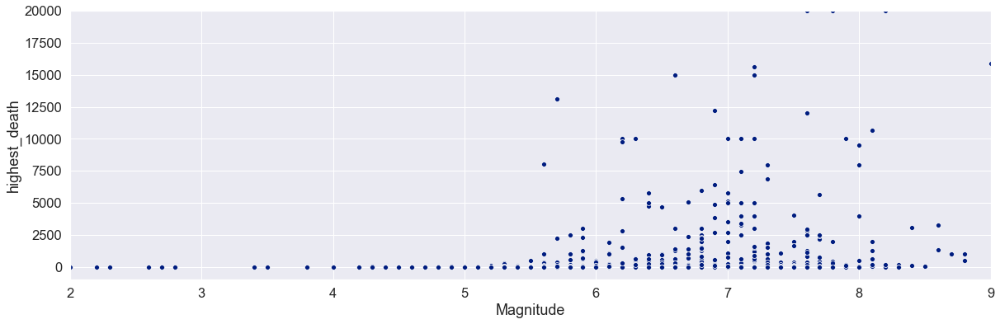

In [113]:
mag_death=pd.read_csv('data/earth_table.csv')
#remove rows that have NaN for highest_death column
#df.dropna(subset=[1])
mag_death=mag_death.dropna(subset=['highest_death'])

#the graph
plt.figure(figsize=(20, 6))
#make a scatter plot magnitue vs highest death
sns.scatterplot(x='Magnitude', y='highest_death', data=mag_death)

# control x and y limits
plt.ylim(-1000, 20000)
plt.xlim(2, 9);

In [114]:
#this gives you one value whereas the one above gives you two values.correlaton 
mag_death['Magnitude'].corr(mag_death['highest_death'])

0.1397039362639968

### not much of a correlation between magnitude and death

### Get only the top 5 countries with the most earthquakes in the century 

In [127]:
#bring in the top 5 countries with the most earthquakes
big_5=pd.read_csv('data/earth_table.csv')

#the .isin allows me to get dataframe that only has these 5 coutries I selected
big_5=big_5.loc[big_5['country'].isin(['China','Indonesia','Turkey','Iran','Japan'])]

#replace the occured secondary effects to just reported
big_5['Secondary_Effects']=big_5['Secondary_Effects'].replace(['L','T','T,L','L,Lq','F','T,F',
                                                               'Lq','T,L,Lq','T,LF','T,Lq','L,F',
                                                               'L,F,Lq'],'report')

In [125]:
px.bar(big_5, x="country", y="highest_death", color='Secondary_Effects', barmode='group',
             height=400)

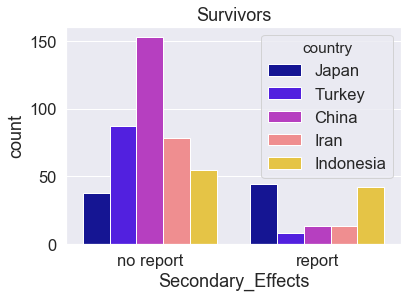

In [269]:
# create plot
sns.countplot(x = 'Secondary_Effects', hue = 'country', data = big_5, palette = 'gnuplot2')
plt.title('Survivors')
plt.show()

In [271]:
eq_average=pd.read_csv('data/earth_table.csv')

In [272]:
eq_average.head()

,Origin_(UTC),country,Lat,Long,Depth_(km),Magnitude,Secondary_Effects,PDE_Shaking_Deaths,PDE_Total_Deaths,Utsu_Total_Deaths,EM-DAT_Total_Deaths,Other_Source_Deaths,highest_death,year
0,1900-05-11 17:23:00,Japan,38.7,141.1,5.0,7.0,no report,NaN,NaN,NaN,NaN,NaN,NaN,1900
1,1900-07-12 06:25:00,Turkey,40.3,43.1,NaN,5.9,no report,NaN,NaN,140.0,NaN,NaN,140.0,1900
2,1900-10-29 09:11:00,Venezuela,11.0,-66.0,0.0,7.7,no report,NaN,NaN,NaN,NaN,NaN,NaN,1900
3,1901-02-15 00:00:00,China,26.0,100.1,0.0,6.5,no report,NaN,NaN,NaN,NaN,NaN,NaN,1901
4,1901-03-31 07:11:00,Bulgaria,43.4,28.7,NaN,6.4,no report,NaN,NaN,4.0,NaN,NaN,4.0,1901


In [305]:
average.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113 entries, 0 to 112
Data columns (total 2 columns):
year         113 non-null int64
Magnitude    113 non-null float64
dtypes: float64(1), int64(1)
memory usage: 7.6 KB


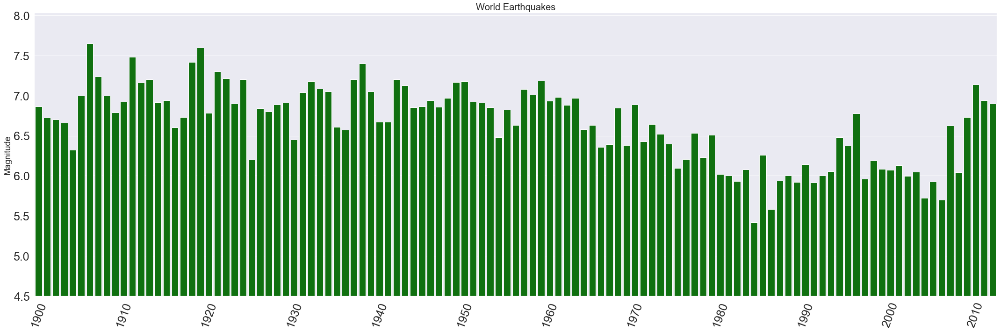

In [317]:
average=eq_average.groupby('year',as_index=None)['Magnitude'].mean()



#now the graph

fig, ax = plt.subplots(figsize=(30,10))
sns.barplot("year", y="Magnitude", data=average,ax=ax,color='green')
            #palette="Greens");

plt.xticks(
    rotation=70, 
    horizontalalignment='center',
    fontweight='light',
    fontsize='medium')

plt.ylabel('Magnitude')
plt.xlabel('')
plt.title('World Earthquakes',size=20)
#this tells me to start my y axis from 4.5 and up.

plt.ylim(bottom=4.5)
#not really sure what tight_layout() does.

plt.tight_layout()
#the changes the size of all the ticks
plt.tick_params(labelsize=25)
#this gives me a y axis in 10s. instead of my 118 values. I have to make a list of that actual values I want 
plt.xticks(np.arange(0,118,10),['1900', '1910', '1920', '1930', '1940', '1950', '1960', '1970', '1980', '1990', '2000',
       '2010']);

In [319]:
np.arange(1900,2018,10)

array([1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990, 2000,
       2010])

In [330]:
eq_av=pd.read_csv('data/earth_table.csv')

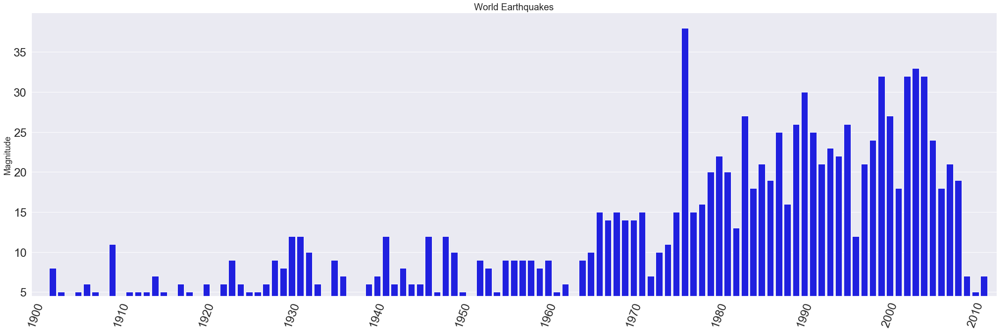

In [331]:
eq_av=eq_av.groupby('year',as_index=None)['Magnitude'].count()


#now the graph

fig, ax = plt.subplots(figsize=(30,10))
sns.barplot("year", y="Magnitude", data=eq_av,ax=ax,color='blue')
            #palette="Greens");

plt.xticks(
    rotation=70, 
    horizontalalignment='center',
    fontweight='light',
    fontsize='medium')

plt.ylabel('Magnitude')
plt.xlabel('')
plt.title('World Earthquakes',size=20)
#this tells me to start my y axis from 4.5 and up.

plt.ylim(bottom=4.5)
#not really sure what tight_layout() does.

plt.tight_layout()
#the changes the size of all the ticks
plt.tick_params(labelsize=25)
#this gives me a y axis in 10s. instead of my 118 values. I have to make a list of that actual values I want 
plt.xticks(np.arange(0,118,10),['1900', '1910', '1920', '1930', '1940', '1950', '1960', '1970', '1980', '1990', '2000',
       '2010']);

### Question 2 ###

In [129]:
url= 'https://earthquake.usgs.gov/fdsnws/event/1/query.csv?starttime=1900-01-01%2000:00:00&endtime=2019-10-15%2023:59:59&maxlatitude=38.204&minlatitude=34.125&maxlongitude=-79.541&minlongitude=-90.879&minmagnitude=0.5&orderby=time-asc' 
r = requests.get(url)
#First, we can read the text into a DataFrame using read_csv
#Another way to make it work is to pass the url itself to read_csv.
eq = pd.read_csv(r.url)
#the df has other states besides tennessee. also, it also has i.e. wester tennessee, souther tennessee 
#i just want tennessee so thats why we do a split
eq.place=eq.place.str.replace(' ','_')

#for t in eq.place: make a function 
def tn_state(t):
    tn_split=str(t).split('_')
    if len(tn_split)==1:
        state=t
    else:
        state=tn_split[-1]
    return state
#apply the function 
eq.place=eq.place.apply(tn_state)

#give me just the data for TN only 
tennessee=eq[eq.place=='Tennessee']

#remove lots of random columns
tennessee= tennessee.drop(columns= ['nst','gap','dmin','rms','updated','horizontalError',
                                   'depthError','magError','magNst','status','locationSource','magSource',
                                   'net','id','magType'])

#converted the time section to datetime type
tennessee['time']=pd.to_datetime(tennessee['time'])
#add a column with just year
tennessee['year']=tennessee['time'].dt.year


### expert the TN data###

In [130]:
#exported my TN dataframe to use for other steps
TN_data=tennessee.to_csv('data/tn_data.csv',index=None)

In [132]:
tennessee.groupby('type')[['mag']].count()

,mag
type,
earthquake,4427
quarry blast,1


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.



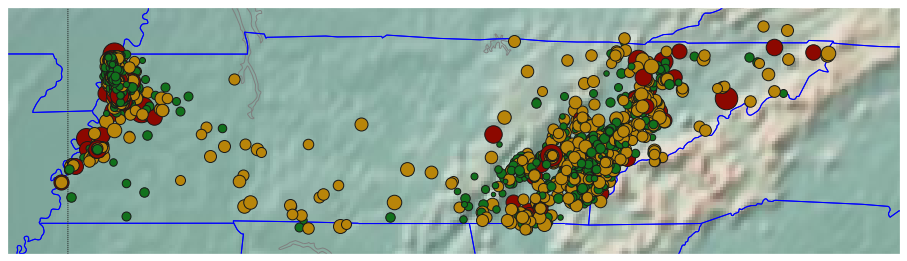

In [135]:
# Open the TN data file.
TN_data = 'data/tn_data.csv'

# Create empty lists for the latitudes and longitudes.
tn_lat, tn_lon = [], []
tn_mag=[]

# Read through the entire file, skip the first line,
#  and pull out just the lats and lons.
with open(TN_data) as t:
    # Create a csv reader object.
    reader_tn = csv.reader(t)
    
    # Ignore the header row.
    next(reader_tn)
    
    # Store the latitudes and longitudes in the appropriate lists.
    for row in reader_tn:
        tn_lat.append(float(row[1]))
        tn_lon.append(float(row[2]))
        tn_mag.append(float(row[4]))
        
def color_mix(tn_mag):
    # Returns green for small earthquakes, yellow for moderate
    #  earthquakes, and red for significant earthquakes.
    if tn_mag < 2:
        return ('go')
    elif tn_mag < 3:
        return ('yo')
    else:
        return ('ro')


# Make this plot larger.
plt.figure(figsize=(16,9))

tn_map = Basemap(projection='merc',resolution='h', area_thresh=.1,
                 llcrnrlon=-90.661706,
                 llcrnrlat=34.728965,
                 urcrnrlon=-80.9296,
                 urcrnrlat=36.914326)
 
tn_map.shadedrelief()
tn_map.drawcoastlines(color='gray')
tn_map.drawcountries(color='gray')
tn_map.drawstates(color='blue',linewidth=1)    
    

tn_map.drawmeridians(np.arange(0, 360, 30))
tn_map.drawparallels(np.arange(-90, 90, 30));

tn_size = 5
for lonn, latt, magg in zip(tn_lon, tn_lat, tn_mag):
    a,b = tn_map(lonn, latt)
    msize_tn = magg * tn_size
    color_marker = color_mix(magg)
    tn_map.plot(a, b, color_marker, markersize=msize_tn,markeredgecolor='k')

In [180]:
tn_part=pd.read_csv('data/tn_data.csv')

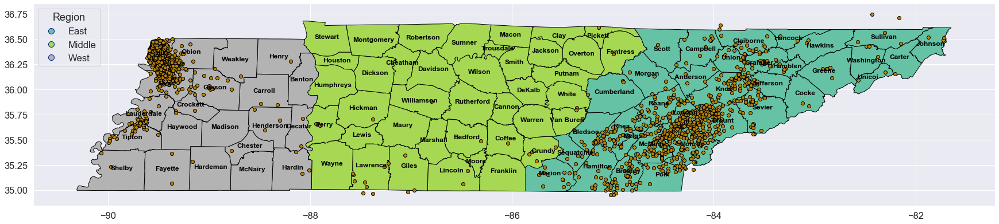

In [197]:
##create a new column called geometry..Point comes for the point package
tn_part['geometry'] = tn_part.apply(lambda row: Point(row['longitude'], row['latitude']), axis = 1)
#we want a geoDataFrame
tn_part = gpd.GeoDataFrame(tn_part, geometry = 'geometry')
#this changes the units of the geometry section. but not needed right now since the original units already match
#with the GIS units of the districs map
####tn_part.geometry = tn_part.geometry.to_crs({'init': 'epsg:4326'})


#bring in the distric GIS
council_districts = gpd.read_file('data/TN_counties/TN_counties.shp')
#change the units of the geometry column. you dont alwasy need to do this step. only if the the units dont match with other df
council_districts.geometry=council_districts.geometry.to_crs({'init': 'epsg:4326'})


##PLOT THEM TOGETHER 

#plot both in the same cell. it will show the crashes on the map
leg_kwds={'title':'Region'}
#this code says plot both on same map
fig, ax = plt.subplots(1,1,figsize = (30,50))


council_districts.plot(ax = ax,column='Grand',legend=True,edgecolor='black',cmap='Set2',legend_kwds=leg_kwds)
tn_part.plot(ax = ax, color = 'y',edgecolor='black')

##the following steps are to label the counties
council_districts['coords'] = council_districts['geometry'].apply(lambda x: x.representative_point().coords[:])
council_districts['coords'] = [coords[0] for coords in council_districts['coords']]
for idx, row in council_districts.iterrows():
    plt.annotate(s=row['NAME'], xy=row['coords'],
                 horizontalalignment='center',color='black',weight='bold',size=12,)

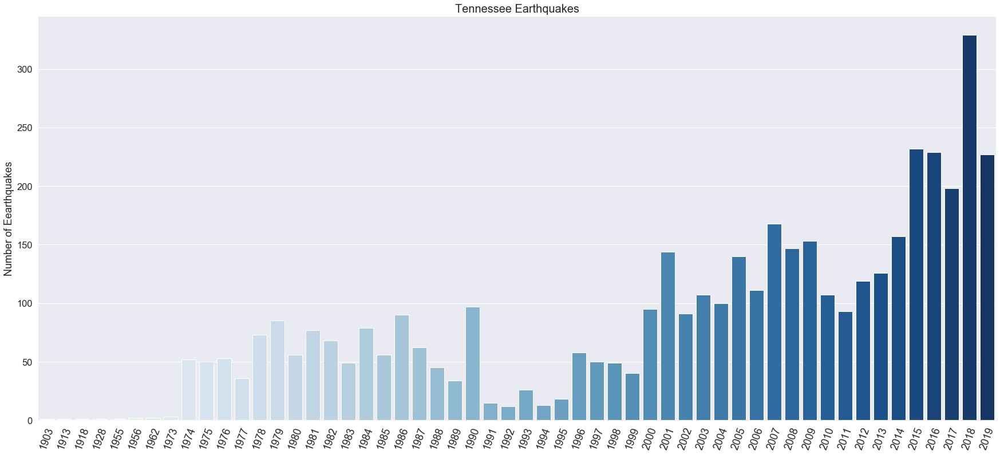

In [254]:
#make a barplot with the number of earthquakes in each year
all_years=tn_part.groupby('year',as_index=None)['mag'].count()

#now the graph

fig, ax = plt.subplots(figsize=(30,13))
sns.barplot("year", y="mag", data=all_years,ax=ax,
            palette="Blues");

plt.xticks(
    rotation=70, 
    horizontalalignment='center',
    fontweight='light',
    fontsize='medium')

plt.ylabel('Number of Eearthquakes')
plt.xlabel('')
plt.title('Tennessee Earthquakes',size=20);

In [270]:
tn_part.head()

,time,latitude,longitude,depth,mag,place,type,year,geometry
0,1903-11-04 18:18:00+00:00,36.500,-89.500,NaN,4.6,Tennessee,earthquake,1903,POINT (-89.5 36.5)
1,1913-03-28 21:50:00+00:00,36.200,-83.700,NaN,4.1,Tennessee,earthquake,1913,POINT (-83.7 36.2)
2,1918-10-16 02:15:00+00:00,36.000,-89.200,NaN,4.5,Tennessee,earthquake,1918,POINT (-89.2 36)
3,1928-11-03 04:02:50.200000+00:00,36.112,-82.828,5.0,4.5,Tennessee,earthquake,1928,POINT (-82.82799999999997 36.112)
4,1955-03-29 09:02:40+00:00,36.000,-89.500,NaN,3.9,Tennessee,earthquake,1955,POINT (-89.5 36)


In [ ]:
##make sure your give Hari credit for this graph.
from folium.plugins import MarkerCluster
import folium
import pandas as pd


 
Nashville = (36.174465, -86.767960)
map = folium.Map(location=Nashville, zoom_start=7, tiles ='openstreetmap')
marker_cluster = MarkerCluster().add_to(map)